In [1]:
__author__ = 'Erwin Chen'
# %matplotlib nbagg
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib as mpl
from astropy.io import fits
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import cPickle as pickle

In [2]:
# load data from fits file
hdulist = fits.open('allStar-v603.fits')
hdulist.info()
tbdata = hdulist[1].data
# APOGEE ID for stars
apogee_ID = tbdata.field('APOGEE_ID')
# Galactic Longitude
l = tbdata.field('GLON')
# Galactic Latitude 
b = tbdata.field('GLAT')
# Right Ascension(J2000)
RA = tbdata.field('RA')
# Declination(J2000)
DEC = tbdata.field('DEC')
# Heliocentric radial velocity
RV = tbdata.field('VHELIO_AVG')
J = tbdata.field('J')
H = tbdata.field('H')
K = tbdata.field('K')
LOGG = tbdata.field('LOGG')
TEFF = tbdata.field('TEFF')
# Proper Motion
PMRA = tbdata.field('PMRA')
PMDEC = tbdata.field('PMDEC')
# 15 elements
elements = np.array(["Al", "Ca", "C", "Fe", "K", "Mg", "Mn", "Na", "Ni", "N", "O", "Si", "S", "Ti", "V"])
AL_H = tbdata.field("AL_H")
CA_H = tbdata.field("CA_H")
C_H = tbdata.field("C_H")
FE_H = tbdata.field('FE_H')
K_H = tbdata.field("K_H")
MG_H = tbdata.field("MG_H")
MN_H = tbdata.field("MN_H")
NA_H = tbdata.field("NA_H")
NI_H = tbdata.field("NI_H")
N_H = tbdata.field("N_H")
O_H = tbdata.field("O_H")
SI_H = tbdata.field("SI_H")
S_H = tbdata.field("S_H")
TI_H = tbdata.field("TI_H")
V_H = tbdata.field("V_H")
# errors for 15 elements
AL_H_ERR = tbdata.field("AL_H_ERR")
CA_H_ERR = tbdata.field("CA_H_ERR")
C_H_ERR = tbdata.field("C_H_ERR")
FE_H_ERR = tbdata.field("FE_H_ERR")
K_H_ERR = tbdata.field("K_H_ERR")
MG_H_ERR = tbdata.field("MG_H_ERR")
MN_H_ERR = tbdata.field("MN_H_ERR")
NA_H_ERR = tbdata.field("NA_H_ERR")
NI_H_ERR = tbdata.field("NI_H_ERR")
N_H_ERR = tbdata.field("N_H_ERR")
O_H_ERR = tbdata.field("O_H_ERR")
SI_H_ERR = tbdata.field("SI_H_ERR")
S_H_ERR = tbdata.field("S_H_ERR")
TI_H_ERR = tbdata.field("TI_H_ERR")
V_H_ERR = tbdata.field("V_H_ERR")

Filename: allStar-v603.fits
No.    Name         Type      Cards   Dimensions   Format
0    PRIMARY     PrimaryHDU      15   ()              
1                BinTableHDU    324   163278R x 151C   [45A, 34A, 44A, 34A, 18A, 8A, I, 16A, E, E, E, E, E, E, D, D, D, D, J, J, 116A, J, I, E, J, 129A, J, 59A, E, E, E, E, E, E, E, E, E, E, E, E, E, E, 2E, 2E, 2E, 2E, 5A, 6A, 4A, I, 7E, 7E, 49E, 49E, 15E, 15E, 15E, 15E, E, E, E, E, E, E, E, E, E, 2A, J, 153A, 7J, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, J, J, J, J, J, J, J, J, J, J, J, J, J, J, J, 15E, 15J, 18A, 12A, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, 17A, E, E, I, I, E, E, 20A, 737A, 665A, 50J, 50J]   
2                ImageHDU         6   (360,)       int32   
3                BinTableHDU     31   1R x 4C      [105A, 30A, 90A, 15I]   


In [3]:
# get chemical abundances of 15 elements for selected stars
def get_matrix(C):
    data = []
    data.append(C_H[C])
    data.append(FE_H[C])
    data.append(N_H[C])
    data.append(O_H[C])
    data.append(MG_H[C])
    data.append(SI_H[C])
    data.append(NI_H[C])
    data.append(AL_H[C])
    data.append(CA_H[C])
    data.append(MN_H[C])
    data.append(NA_H[C])
    data.append(S_H[C])
    data.append(K_H[C])
    data.append(TI_H[C])
    data.append(V_H[C])
    data = np.array(data)
    data = data.T
    return data

# get chemical abundances normalized by mean error of 15 elements for selected stars
def get_matrix_normalized(C):
    data = []
    data.append(C_H[C] / np.mean(C_H_ERR[C]))
    data.append(FE_H[C] / np.mean(FE_H_ERR[C]))
    data.append(N_H[C] / np.mean(N_H_ERR[C]))
    data.append(O_H[C] / np.mean(O_H_ERR[C]))
    data.append(MG_H[C] / np.mean(MG_H_ERR[C]))
    data.append(SI_H[C] / np.mean(SI_H_ERR[C]))
    data.append(NI_H[C] / np.mean(NI_H_ERR[C]))
    data.append(AL_H[C] / np.mean(AL_H_ERR[C]))
    data.append(CA_H[C] / np.mean(CA_H_ERR[C]))
    data.append(MN_H[C] / np.mean(MN_H_ERR[C]))
    data.append(NA_H[C] / np.mean(NA_H_ERR[C]))
    data.append(S_H[C] / np.mean(S_H_ERR[C]))
    data.append(K_H[C] / np.mean(K_H_ERR[C]))
    data.append(TI_H[C] / np.mean(TI_H_ERR[C]))
    data.append(V_H[C] / np.mean(V_H_ERR[C]))
    data = np.array(data)
    data = data.T
    return data

# all stars with 15 elements
C = np.where(
        (LOGG > -9999.) * (TEFF > -9999.) * (RV < 999999.0) *
        (AL_H > -9999.) * (CA_H > -9999.) * (C_H > -9999.0) *
        (FE_H > -9999.) * (K_H > -9999.0) * (MG_H > - 9999.0) *
        (MN_H > -9999.) * (NA_H > -9999.0) * (NI_H > -9999.) *
        (N_H > -9999.) * (O_H > -9999.0) * (SI_H > -9999.) *
        (S_H > -9999.) * (TI_H > -9999.) * (V_H > -9999.))[0]

explained variance ratio for all stars
[ 0.812  0.089  0.027]
elements available:
['Al' 'Ca' 'C' 'Fe' 'K' 'Mg' 'Mn' 'Na' 'Ni' 'N' 'O' 'Si' 'S' 'Ti' 'V']


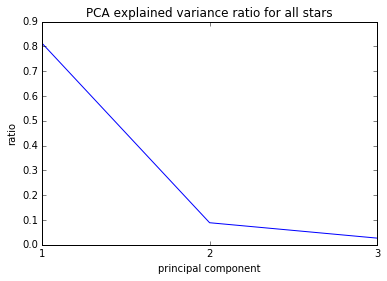

In [9]:
# PCA for all stars
# get data matrix for all stars
data = get_matrix(C)
# PCA
n = 3
pca = PCA(n_components=n)
pca._fit(data)
print "explained variance ratio for all stars"
# get explained variance ratio 
ratio = np.around(pca.explained_variance_ratio_, decimals=3)
print ratio
print "elements available:"
print elements
# plot explained variance ratio
f, ax = plt.subplots()
x = range(1,n+1)
ax.plot(x, ratio)
ax.set_title('PCA explained variance ratio for all stars')
ax.set_xlabel("principal component")
ax.set_ylabel("ratio")
ax.set_xticks(x)
plt.show()

explained variance ratio for all stars
[ 0.904  0.021  0.012]
elements available:
['Al' 'Ca' 'C' 'Fe' 'K' 'Mg' 'Mn' 'Na' 'Ni' 'N' 'O' 'Si' 'S' 'Ti' 'V']


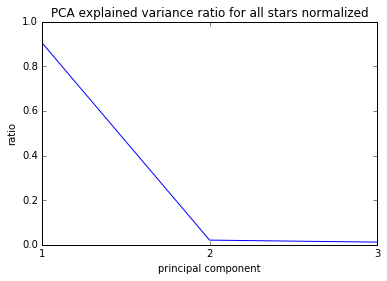

In [11]:
# PCA for all stars normalized by mean error
# get data matrix for all stars
data_norm = get_matrix_normalized(C)
# PCA
n = 3
pca_normalized = PCA(n_components=n)
pca_normalized._fit(data)
print "explained variance ratio for all stars"
# get explained variance ratio 
ratio = np.around(pca_normalized.explained_variance_ratio_, decimals=3)
print ratio
print "elements available:"
print elements
# plot explained variance ratio
f, ax = plt.subplots()
x = range(1,n+1)
ax.plot(x, ratio)
ax.set_title('PCA explained variance ratio for all stars normalized')
ax.set_xlabel("principal component")
ax.set_ylabel("ratio")
ax.set_xticks(x)
plt.show()

In [13]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=C.size/100, n_init=10)
kmeans.fit(data)
labels = kmeans.labels_
print "%i Kmeans groups found"%labels.max()

843 Kmeans groups found


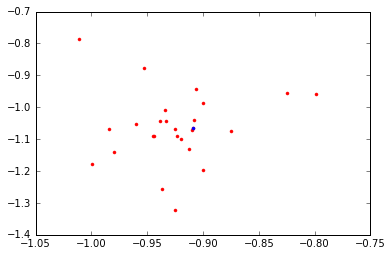

M107 26 1


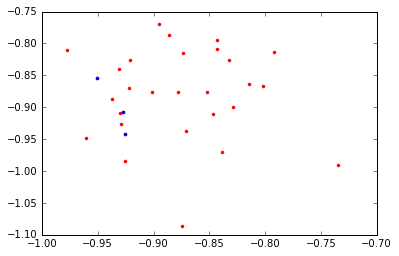

M107 30 3


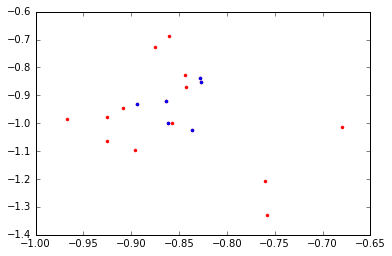

M107 19 6


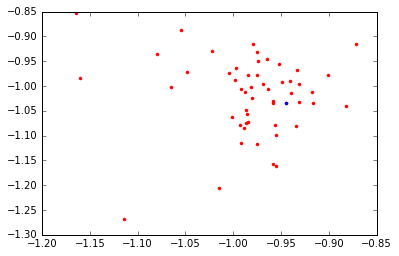

M107 53 1


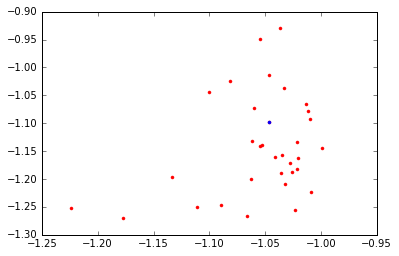

M107 33 1


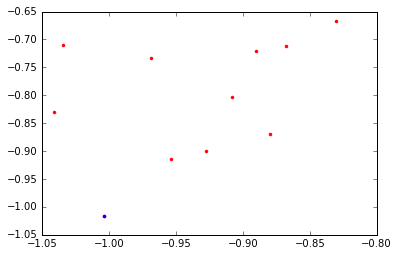

M107 11 1


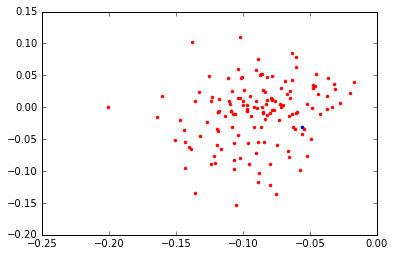

M107 144 1


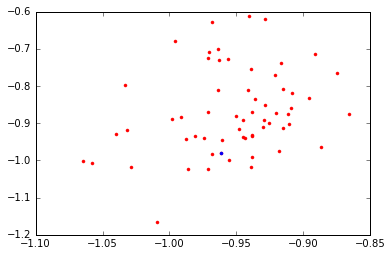

M107 61 1


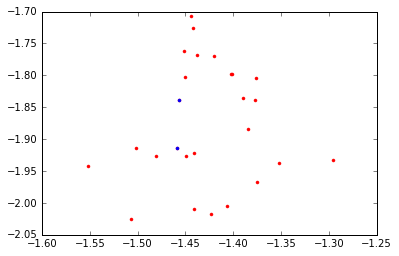

M13 26 2


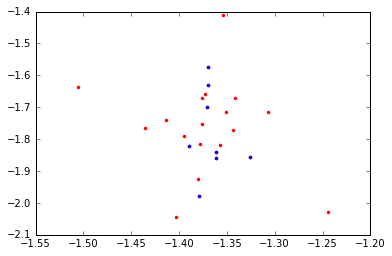

M13 25 8


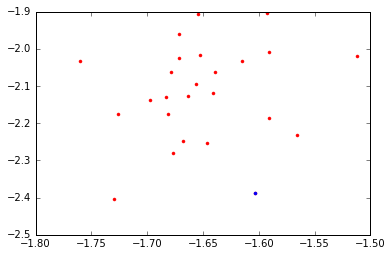

M13 25 1


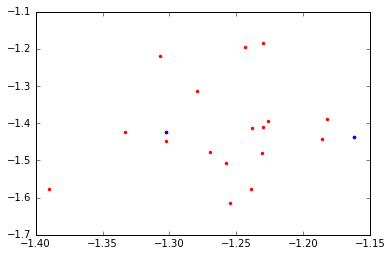

M13 19 2


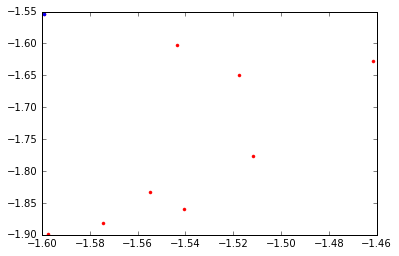

M13 9 1


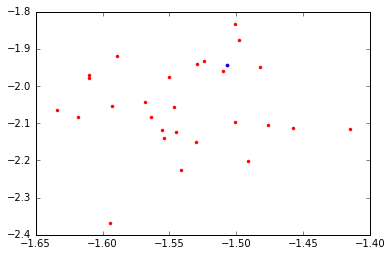

M13 28 1


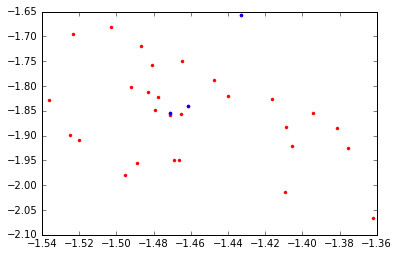

M13 31 3


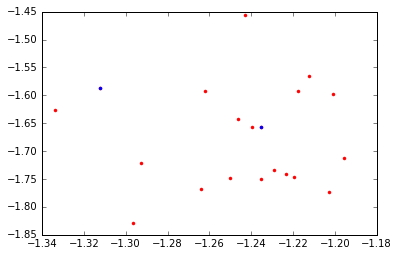

M13 20 2


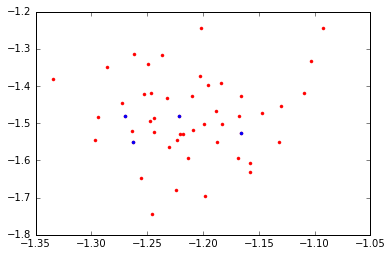

M5 49 4


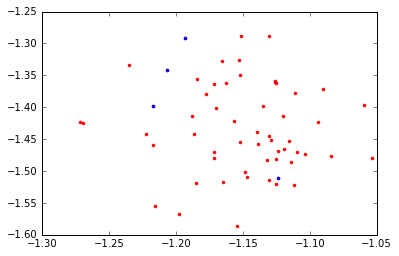

M5 58 4


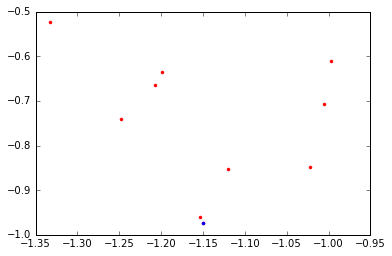

M5 10 1


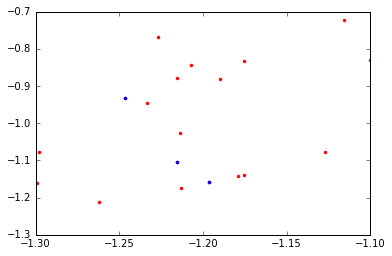

M5 19 3


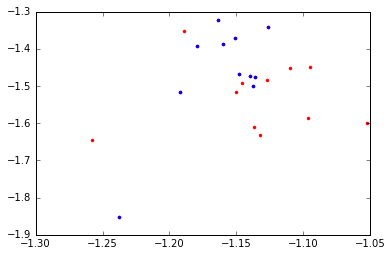

M5 22 11


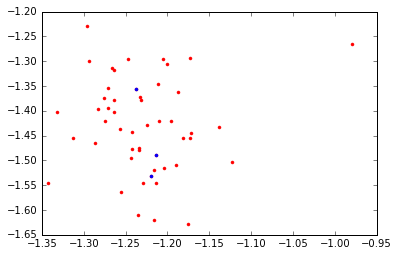

M5 50 3


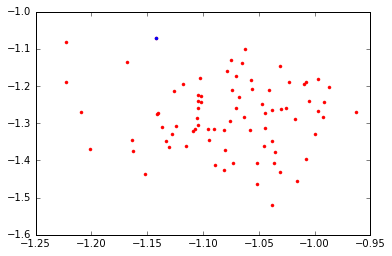

M5 80 1


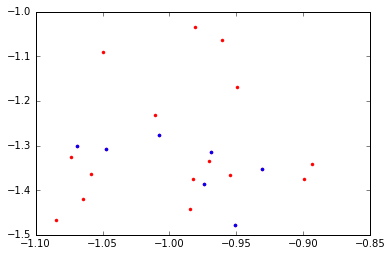

M5 22 7


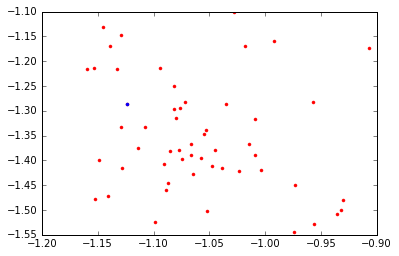

M5 54 1


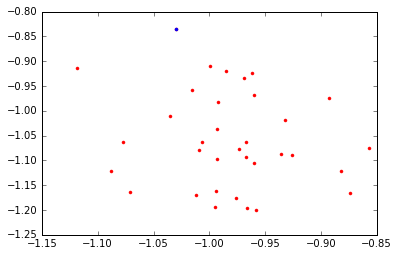

M5 34 1


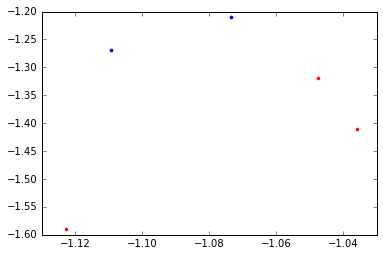

M5 5 2


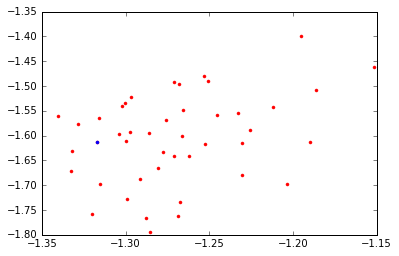

M5 44 1


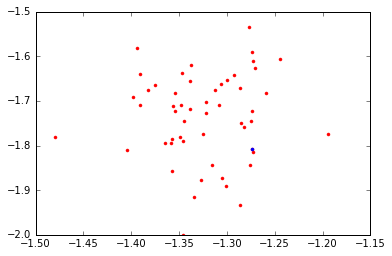

M5 53 1


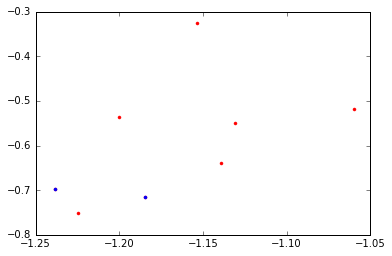

M5 8 2


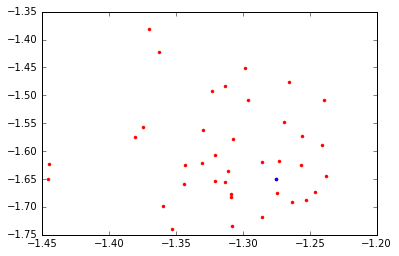

M5 39 1


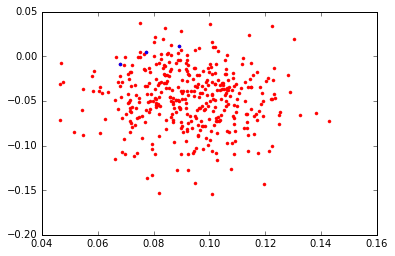

N6819 392 3


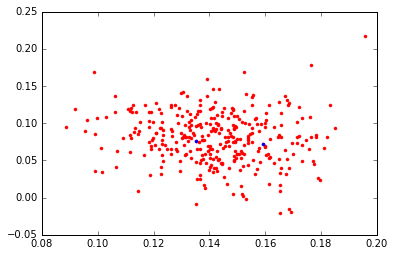

N6819 335 2


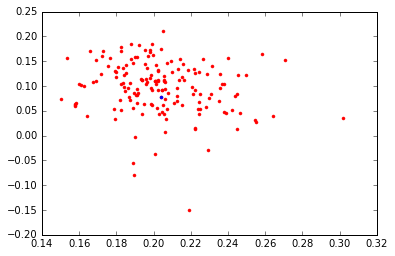

N6819 167 1


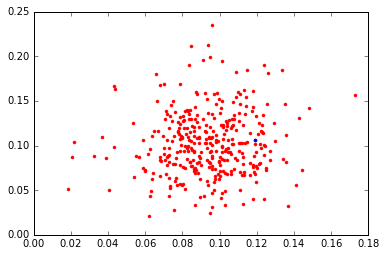

N6819 352 1


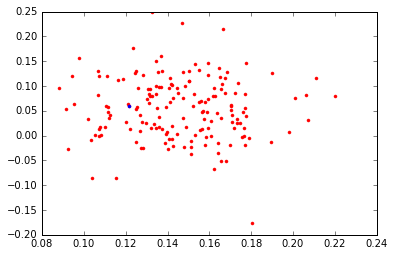

N6819 170 1


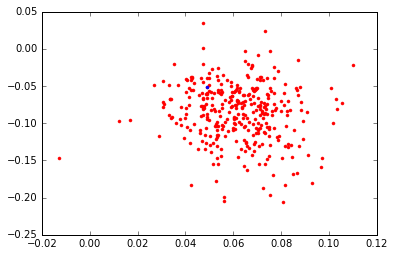

N6819 347 1


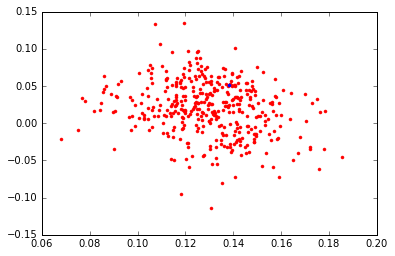

N6819 397 1


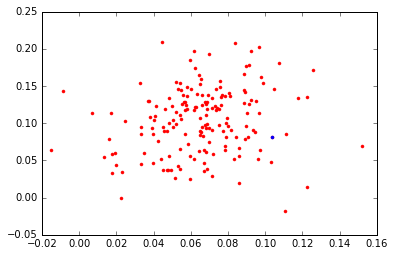

N6819 173 1


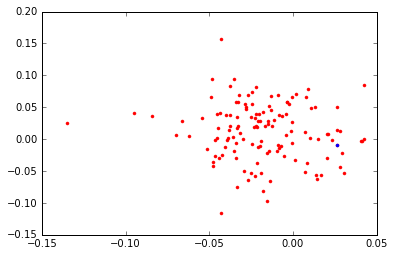

N6819 130 1


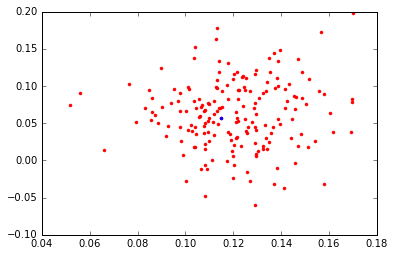

N6819 185 1


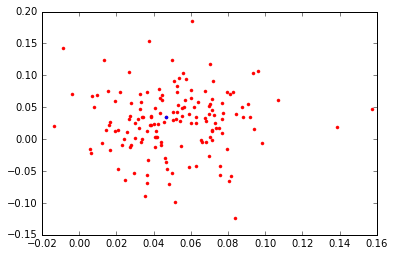

N6819 152 1


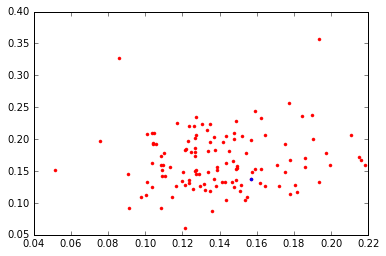

N6819 123 1


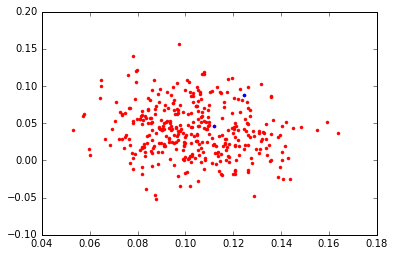

N6819 372 2


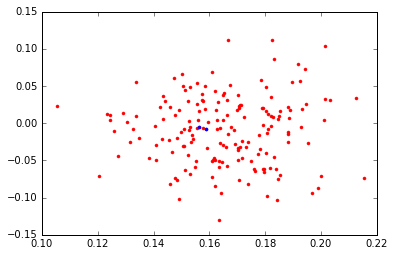

N6819 177 2


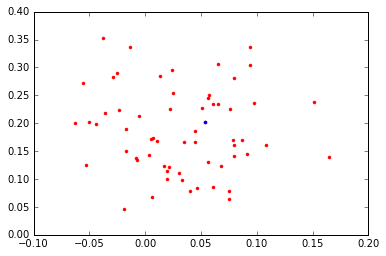

N6819 62 1


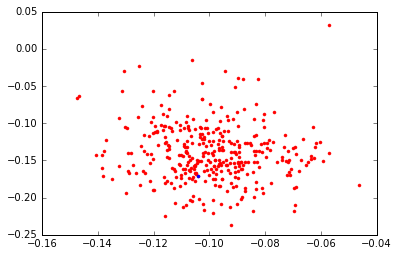

N6819 360 1


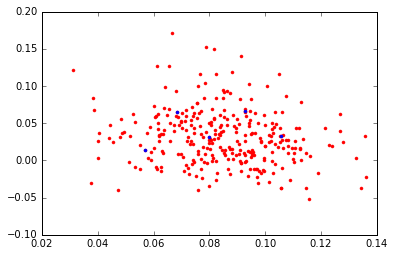

N6819 306 5


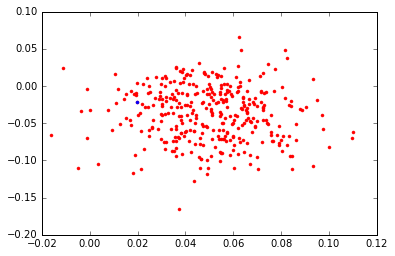

N6819 356 1


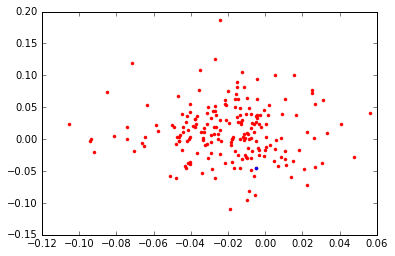

N6819 202 1


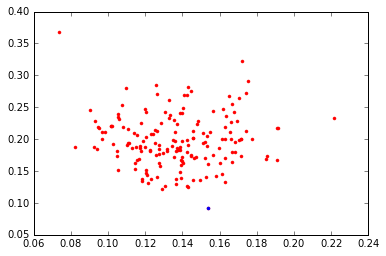

N6819 174 1


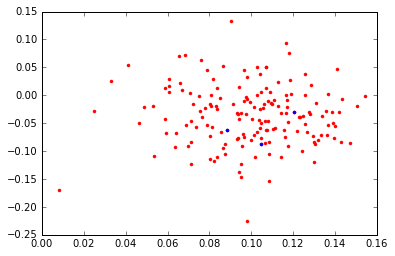

M67 165 3


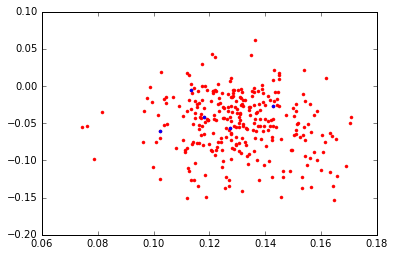

M67 297 5


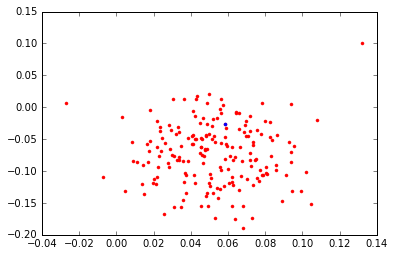

M67 189 1


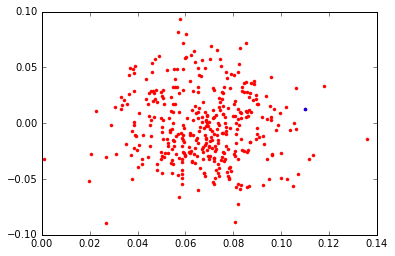

M67 386 1


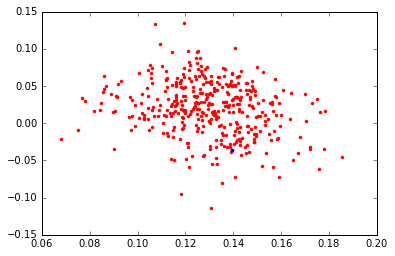

M67 397 1


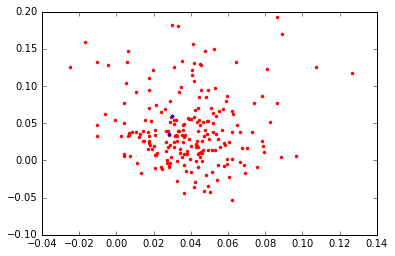

M67 219 2


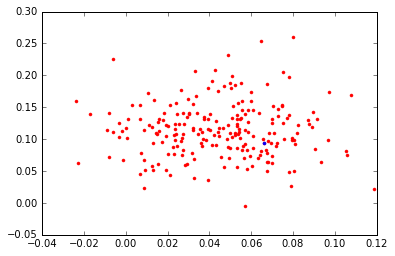

M67 218 1


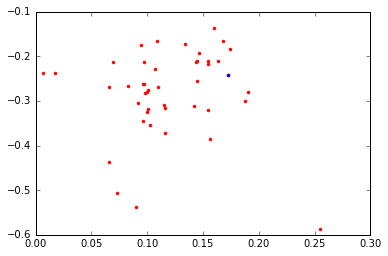

M67 44 1


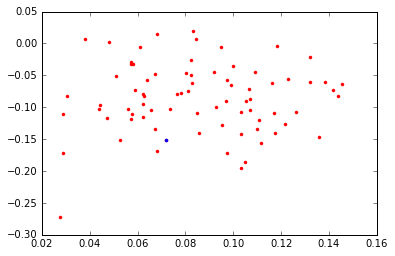

M67 77 1


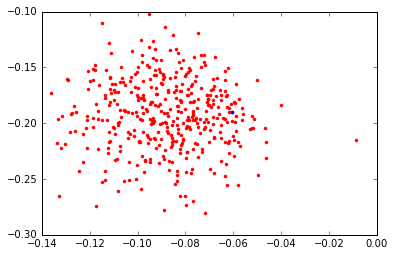

M67 413 1


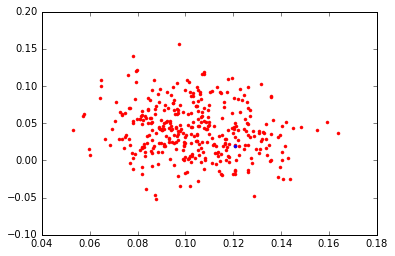

M67 372 1


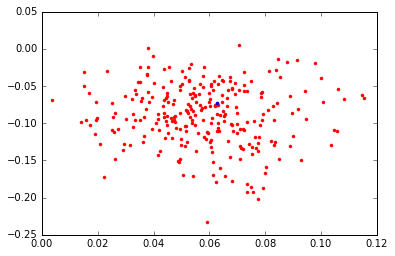

M67 273 1


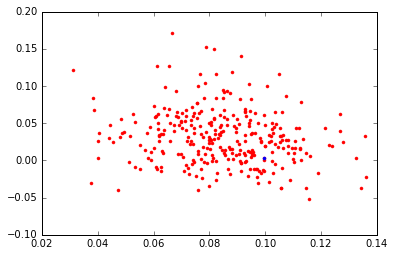

M67 306 1


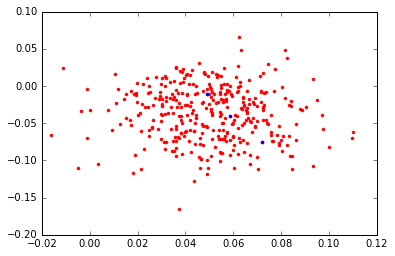

M67 356 3


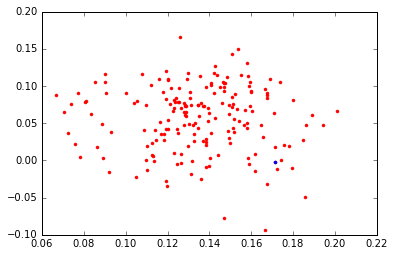

M67 187 1


In [23]:
# compare the KMeans groups to known clusters 
# load known members
known_clusters = np.loadtxt('table4.dat', usecols=(0, 1), dtype=('S', 'S'), unpack=True)
# names of all known clusters
known_clusters_names = known_clusters[1]
# M92, M15, M53, N5466, M2, M13, M3, M5, M107, M71, N2158, N2420, N188, M67, Pleiades, N6819, N6791
# APOGEE IDs for all known members
known_clusters_ID = known_clusters[0]
# get all known members
members = np.array([np.where(ID == apogee_ID)[0][0] for ID in known_clusters_ID])
# get members with all 15 elements
members_15 = np.intersect1d(C, members)
# clusters with significant number of members
clusters_names = np.array(["M107", "M13", "M5", "N6819", "M67"])
for name in clusters_names:
    # get members of a known cluster
    name_members_ID = known_clusters_ID[np.where(name == known_clusters_names)]
    name_members = np.array([np.where(ID == apogee_ID)[0][0] for ID in name_members_ID])
    name_members = np.intersect1d(name_members, members_15)
    for i in range(1, labels.max()+1):
        group = C[np.where(labels == i)[0]]
        overlap = np.intersect1d(name_members, group)
        if overlap.size > 0:
            fig = plt.figure()
            plt.plot(FE_H[group],C_H[group], "r.")
            plt.plot(FE_H[overlap],C_H[overlap], "b.")
            plt.show()
            print name, group.size, overlap.size

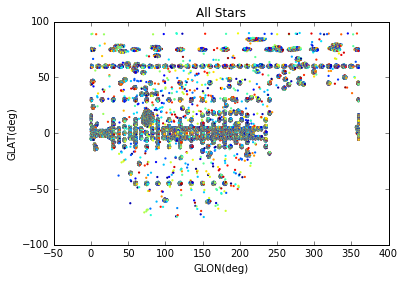

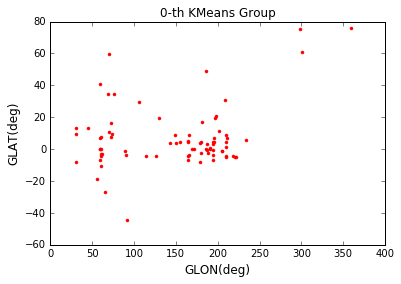

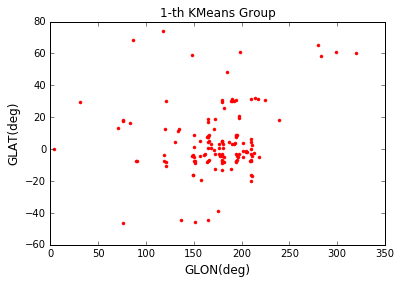

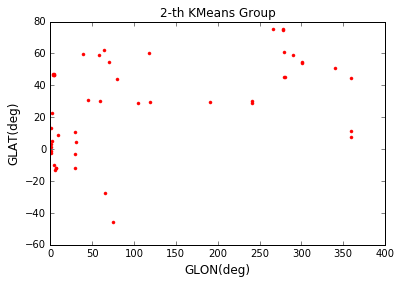

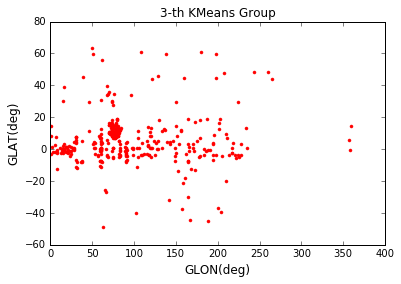

...

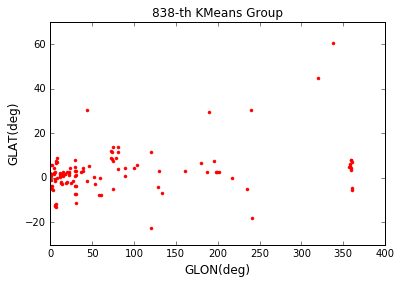

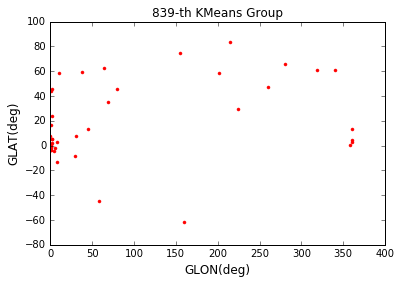

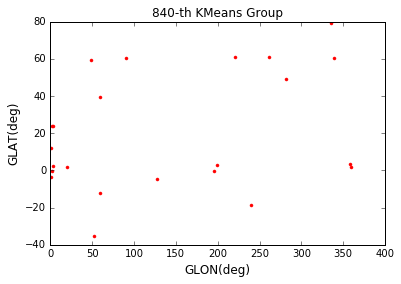

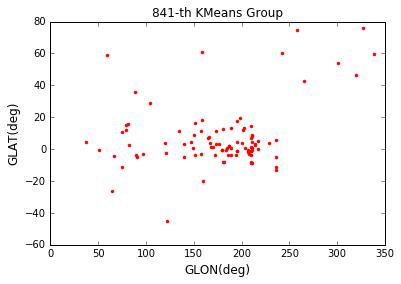

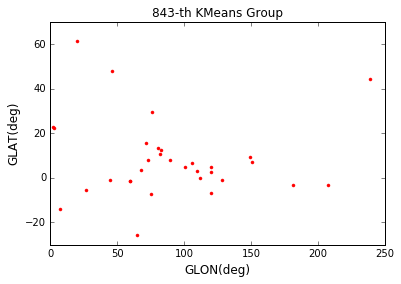

In [15]:
plt.scatter(l[C], b[C], c=labels, s=5, linewidth=0)
plt.title("All Stars")
plt.xlabel("GLON(deg)")
plt.ylabel("GLAT(deg)")
plt.show()
for n in range(labels.max()+1):
    group_stars = C[np.where(labels == n)[0]]
    if group_stars.size > 20:
        fig = plt.figure()
        plt.plot(l[group_stars], b[group_stars], "r.")
        plt.title("%i-th KMeans Group"%n)
        plt.xlabel("GLON(deg)", fontsize=12)
        plt.ylabel("GLAT(deg)", fontsize=12)
        plt.show()

In [ ]:
kmeans.fit(data_norm)
labels_norm = kmeans.labels_
print "%i Kmeans groups found"%labels_norm.max()